<a href="https://colab.research.google.com/github/williamapc/FlowersRecognition1/blob/main/Reco_plantes_analyse_dataset_20250805.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install opencv-python

In [ ]:
import os
import time
import shutil
import pathlib
import itertools

# import data handling tools
import numpy as np
import pandas as pd

# import image handling tools
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow
import seaborn as sns
# sns.set_style('darkgrid') # Commented out this line
print ('modules loaded')

modules loaded


In [ ]:
data_dir ='/content/drive/MyDrive/Reco-Plantes/Preparation manuelle du jeu de données V1'
print(f"{data_dir} find" if os.path.exists(data_dir) else f"{data_dir} not found")

filepaths = []
labels = []

folds = os.listdir(data_dir)
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    # Check if the item in the data_dir is a directory
    if os.path.isdir(foldpath):
        subfolders = os.listdir(foldpath)
        for subfolder in subfolders:
            subfolder_path = os.path.join(foldpath, subfolder)
            # Check if the item in the subfolder is a directory
            if os.path.isdir(subfolder_path):
                filelist = os.listdir(subfolder_path)
                for file in filelist:
                    fpath = os.path.join(subfolder_path, file)
                    filepaths.append(fpath)
                    labels.append(subfolder) # Use the subfolder name as the label

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
df = pd.concat([Fseries, Lseries], axis= 1)

/content/drive/MyDrive/Reco-Plantes/Preparation manuelle du jeu de données V1 find


In [ ]:
display(df)

,filepaths,labels
0,/content/drive/MyDrive/Reco-Plantes/Preparatio...,Tomato___Target_Spot
1,/content/drive/MyDrive/Reco-Plantes/Preparatio...,Tomato___Target_Spot
2,/content/drive/MyDrive/Reco-Plantes/Preparatio...,Tomato___Target_Spot
3,/content/drive/MyDrive/Reco-Plantes/Preparatio...,Tomato___Target_Spot
4,/content/drive/MyDrive/Reco-Plantes/Preparatio...,Tomato___Target_Spot
...,...,...
101946,/content/drive/MyDrive/Reco-Plantes/Preparatio...,Apple___healthy
101947,/content/drive/MyDrive/Reco-Plantes/Preparatio...,Apple___healthy
101948,/content/drive/MyDrive/Reco-Plantes/Preparatio...,Apple___healthy
101949,/content/drive/MyDrive/Reco-Plantes/Preparatio...,Apple___healthy


In [ ]:
nbre_images_categories = df.labels.value_counts()
print("Number of images per category:")
display(nbre_images_categories)

Number of images per category:


,count
labels,
Orange___Haunglongbing_(Citrus_greening),5507
Tomato___Tomato_Yellow_Leaf_Curl_Virus,5357
Soybean___healthy,5100
Apple___Apple_scab,2520
Apple___healthy,2510
"Pepper,_bell___healthy",2486
Apple___Black_rot,2484
Potato___Late_blight,2424
Potato___Early_blight,2424


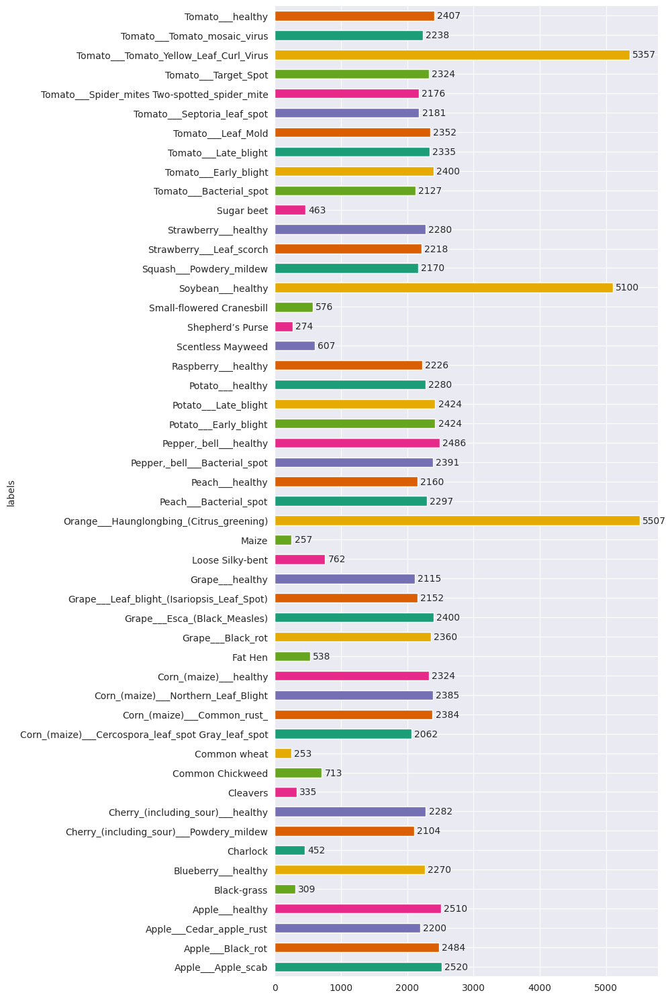

In [ ]:
# @title labels

from matplotlib import pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 15)) # Adjust the figure size as needed
ax = df.groupby('labels').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout() # Add tight_layout to prevent labels from overlapping

# Add labels to the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', padding=3)

/tmp/ipython-input-555717933.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  random_images = df.groupby('labels').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)


Displaying one random image per category (3 per row):


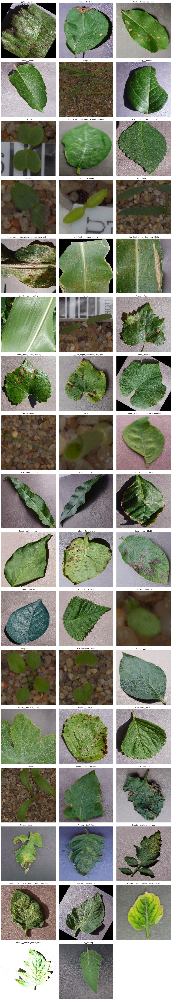

In [ ]:
import random
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Set the random seed for reproducibility
random.seed(42)

# Group the DataFrame by labels and sample one file path from each group
random_images = df.groupby('labels').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)

print("Displaying one random image per category (3 per row):")

num_cols = 3
num_images = len(random_images)
num_rows = (num_images + num_cols - 1) // num_cols

plt.figure(figsize=(15, num_rows * 5)) # Adjust figure size based on number of rows

for i, (index, row) in enumerate(random_images.iterrows()):
    label = row['labels']
    filepath = row['filepaths']

    try:
        img = cv2.imread(filepath)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB for matplotlib

            plt.subplot(num_rows, num_cols, i + 1)
            plt.imshow(img)
            plt.title(label, fontsize=10)
            plt.axis('off') # Hide axes

        else:
            print(f"Could not load image {filepath}")

    except Exception as e:
        print(f"Could not display image {filepath}: {e}")

plt.tight_layout()
plt.show()

In [ ]:
import cv2
import os
import numpy as np

# Define batch size
batch_size = 10000 # Increased batch size
image_heights = []
image_widths = []

# Iterate through the dataframe in batches
for i in range(0, len(df), batch_size):
    batch_df = df.iloc[i:i + batch_size]
    print(f"Processing batch {i // batch_size + 1}/{(len(df) + batch_size - 1) // batch_size}")

    for index, row in batch_df.iterrows():
        filepath = row['filepaths']
        try:
            img = cv2.imread(filepath)
            if img is not None:
                height, width, _ = img.shape
                image_heights.append(height)
                image_widths.append(width)
            else:
                print(f"Could not load image: {filepath}")
        except Exception as e:
            print(f"Error processing image {filepath}: {e}")

print("Finished processing batches.")

# Now you can calculate statistics on image_heights and image_widths
min_height = np.min(image_heights)
max_height = np.max(image_heights)
median_height = np.median(image_heights)
std_height = np.std(image_heights)
print(f"\nHeight Statistics: Min={min_height}, Max={max_height}, Median={median_height}, Std Dev={std_height}")

min_width = np.min(image_widths)
max_width = np.max(image_widths)
median_width = np.median(image_widths)
std_width = np.std(image_widths)
print(f"Width Statistics: Min={min_width}, Max={max_width}, Median={median_width}, Std Dev={std_width}")

Processing batch 1/11
Processing batch 2/11
Processing batch 3/11
Processing batch 4/11
Processing batch 5/11
Processing batch 6/11
Processing batch 7/11
Processing batch 8/11
Processing batch 9/11
Processing batch 10/11
Processing batch 11/11
Finished processing batches.

Height Statistics: Min=49, Max=3457, Median=256.0, Std Dev=71.79947600800371
Width Statistics: Min=49, Max=3652, Median=256.0, Std Dev=72.36237509431406


In [ ]:
import matplotlib.pyplot as plt

# Create a figure and axes for the boxplots
plt.figure(figsize=(10, 6))

# Boxplot for Image Heights
plt.subplot(1, 2, 1) # 1 row, 2 columns, 1st plot
plt.boxplot(image_heights, patch_artist=True, boxprops=dict(facecolor='skyblue'))
plt.title('Distribution of Image Heights')
plt.ylabel('Height (pixels)')
plt.xticks([]) # Hide x-axis ticks as there's only one boxplot

# Boxplot for Image Widths
plt.subplot(1, 2, 2) # 1 row, 2 columns, 2nd plot
plt.boxplot(image_widths, patch_artist=True, boxprops=dict(facecolor='lightcoral'))
plt.title('Distribution of Image Widths')
plt.ylabel('Width (pixels)')
plt.xticks([]) # Hide x-axis ticks as there's only one boxplot


plt.tight_layout() # Adjust layout to prevent overlapping
plt.show()

In [ ]:
import numpy as np
import cv2
import pandas as pd # Added import for pandas if not already present

# Define the sampling percentage
sampling_percentage = 0.10

# Sample the dataframe by taking the specified percentage from each category
sampled_df = df.groupby('labels').apply(lambda x: x.sample(frac=sampling_percentage, random_state=42)).reset_index(drop=True)

print(f"Analyzing color distribution on a sampled dataset ({len(sampled_df)} images).")

# Initialize histograms
hist_r = np.zeros(256, dtype=np.int64)
hist_g = np.zeros(256, dtype=np.int64)
hist_b = np.zeros(256, dtype=np.int64)

# Define batch size for processing (can be adjusted, even for the sample)
batch_size = 5000 # Adjust batch size as needed for the sampled data

# Iterate through the sampled dataframe in batches
for i in range(0, len(sampled_df), batch_size):
    batch_df = sampled_df.iloc[i:i + batch_size]
    print(f"Processing color distribution for batch {i // batch_size + 1}/{(len(sampled_df) + batch_size - 1) // batch_size}")

    for index, row in batch_df.iterrows():
        filepath = row['filepaths']
        try:
            img = cv2.imread(filepath)
            if img is not None:
                # Convert BGR to RGB
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                # Calculate histogram for each channel in the current image
                hist_r_img, _ = np.histogram(img_rgb[:, :, 0], bins=256, range=[0, 256])
                hist_g_img, _ = np.histogram(img_rgb[:, :, 1], bins=256, range=[0, 256])
                hist_b_img, _ = np.histogram(img_rgb[:, :, 2], bins=256, range=[0, 256])

                # Add image histograms to the total histograms
                hist_r += hist_r_img
                hist_g += hist_g_img
                hist_b += hist_b_img

            else:
                print(f"Could not load image for color analysis: {filepath}")
        except Exception as e:
            print(f"Error processing image {filepath} for color analysis: {e}")

print("Finished processing images for color distribution.")

/tmp/ipython-input-1720180566.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = df.groupby('labels').apply(lambda x: x.sample(frac=sampling_percentage, random_state=42)).reset_index(drop=True)


Analyzing color distribution on a sampled dataset (10195 images).
Processing color distribution for batch 1/3
Processing color distribution for batch 2/3
Processing color distribution for batch 3/3
Finished processing images for color distribution.


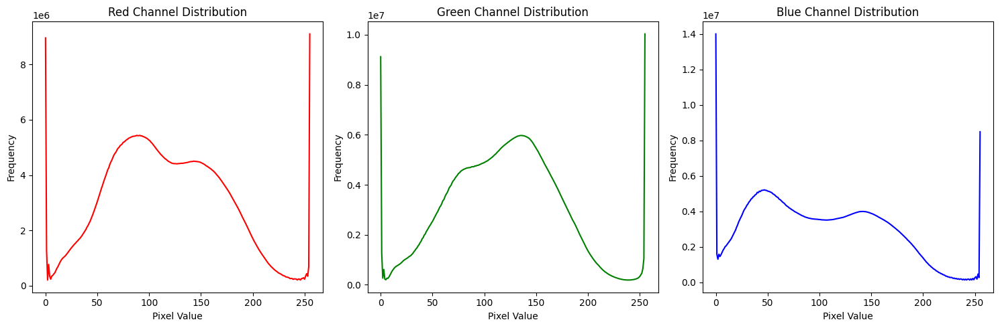

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 5))

# Plot the histogram for the Red channel
plt.subplot(1, 3, 1)
plt.plot(hist_r, color='red')
plt.title('Red Channel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# Plot the histogram for the Green channel
plt.subplot(1, 3, 2)
plt.plot(hist_g, color='green')
plt.title('Green Channel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# Plot the histogram for the Blue channel
plt.subplot(1, 3, 3)
plt.plot(hist_b, color='blue')
plt.title('Blue Channel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

Analyzing image quality characteristics on a sampled dataset (10195 images).
Processing image quality for batch 1/11
Processing image quality for batch 2/11
Processing image quality for batch 3/11
Processing image quality for batch 4/11
Processing image quality for batch 5/11
Processing image quality for batch 6/11
Processing image quality for batch 7/11
Processing image quality for batch 8/11
Processing image quality for batch 9/11
Processing image quality for batch 10/11
Processing image quality for batch 11/11
Finished processing images for quality analysis.


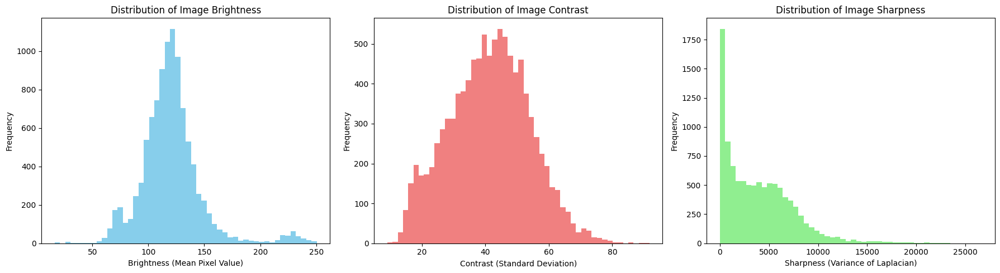

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd # Ensure pandas is imported

# Assuming 'sampled_df' is already loaded and contains 'filepaths' and 'labels'

brightness_values = []
contrast_values = []
sharpness_values = []

# Define batch size for processing
batch_size = 1000 # Adjust batch size as needed

print(f"Analyzing image quality characteristics on a sampled dataset ({len(sampled_df)} images).")

# Iterate through the sampled dataframe in batches
for i in range(0, len(sampled_df), batch_size):
    batch_df = sampled_df.iloc[i:i + batch_size]
    print(f"Processing image quality for batch {i // batch_size + 1}/{(len(sampled_df) + batch_size - 1) // batch_size}")

    for index, row in batch_df.iterrows():
        filepath = row['filepaths']
        try:
            img = cv2.imread(filepath)
            if img is not None:
                # Convert to grayscale for contrast and sharpness calculations
                gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

                # Calculate Brightness (mean pixel value)
                brightness = np.mean(gray_img)
                brightness_values.append(brightness)

                # Calculate Contrast (standard deviation of pixel values)
                contrast = np.std(gray_img)
                contrast_values.append(contrast)

                # Calculate Sharpness (variance of the Laplacian)
                # Apply Laplacian filter
                laplacian_var = cv2.Laplacian(gray_img, cv2.CV_64F).var()
                sharpness_values.append(laplacian_var)

            else:
                print(f"Could not load image for quality analysis: {filepath}")
        except Exception as e:
            print(f"Error processing image {filepath} for quality analysis: {e}")

print("Finished processing images for quality analysis.")

# Now visualize the distributions
plt.figure(figsize=(18, 5))

# Brightness distribution
plt.subplot(1, 3, 1)
plt.hist(brightness_values, bins=50, color='skyblue')
plt.title('Distribution of Image Brightness')
plt.xlabel('Brightness (Mean Pixel Value)')
plt.ylabel('Frequency')

# Contrast distribution
plt.subplot(1, 3, 2)
plt.hist(contrast_values, bins=50, color='lightcoral')
plt.title('Distribution of Image Contrast')
plt.xlabel('Contrast (Standard Deviation)')
plt.ylabel('Frequency')

# Sharpness distribution
plt.subplot(1, 3, 3)
plt.hist(sharpness_values, bins=50, color='lightgreen')
plt.title('Distribution of Image Sharpness')
plt.xlabel('Sharpness (Variance of Laplacian)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

Analyzing aspect ratio on a sampled dataset (10195 images).
Processing aspect ratio for batch 1/11
Processing aspect ratio for batch 2/11
Processing aspect ratio for batch 3/11
Processing aspect ratio for batch 4/11
Processing aspect ratio for batch 5/11
Processing aspect ratio for batch 6/11
Processing aspect ratio for batch 7/11
Processing aspect ratio for batch 8/11
Processing aspect ratio for batch 9/11
Processing aspect ratio for batch 10/11
Processing aspect ratio for batch 11/11
Finished processing images for aspect ratio.


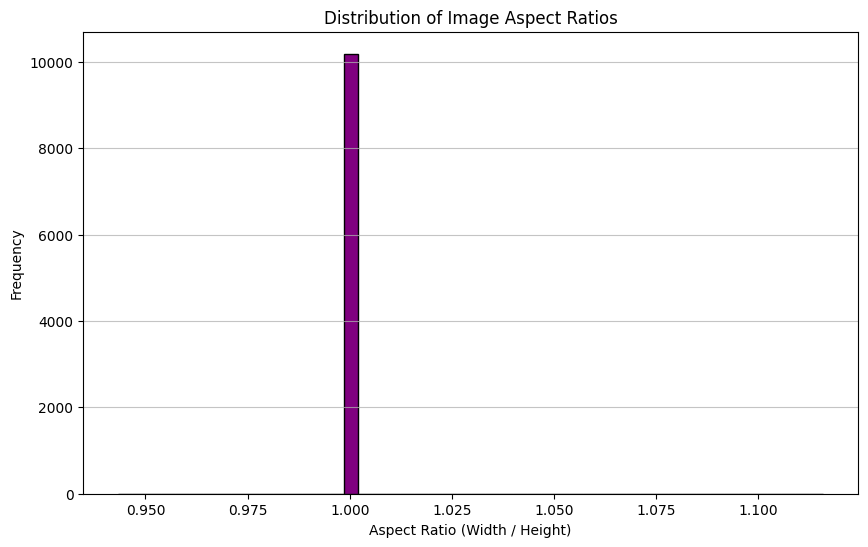

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd # Ensure pandas is imported

# Assuming 'sampled_df' is already loaded and contains 'filepaths'

aspect_ratios = []

# Define batch size for processing
batch_size = 1000 # Adjust batch size as needed

print(f"Analyzing aspect ratio on a sampled dataset ({len(sampled_df)} images).")

# Iterate through the sampled dataframe in batches
for i in range(0, len(sampled_df), batch_size):
    batch_df = sampled_df.iloc[i:i + batch_size]
    print(f"Processing aspect ratio for batch {i // batch_size + 1}/{(len(sampled_df) + batch_size - 1) // batch_size}")

    for index, row in batch_df.iterrows():
        filepath = row['filepaths']
        try:
            img = cv2.imread(filepath)
            if img is not None:
                height, width, _ = img.shape
                if height > 0: # Avoid division by zero
                    aspect_ratio = width / height
                    aspect_ratios.append(aspect_ratio)
                else:
                    print(f"Warning: Image {filepath} has zero height.")
            else:
                print(f"Could not load image for aspect ratio analysis: {filepath}")
        except Exception as e:
            print(f"Error processing image {filepath} for aspect ratio analysis: {e}")

print("Finished processing images for aspect ratio.")

# Now visualize the distribution
plt.figure(figsize=(10, 6))
plt.hist(aspect_ratios, bins=50, color='purple', edgecolor='black')
plt.title('Distribution of Image Aspect Ratios')
plt.xlabel('Aspect Ratio (Width / Height)')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()

File format distribution:


,count
file_format,
.jpg,9641
.png,554


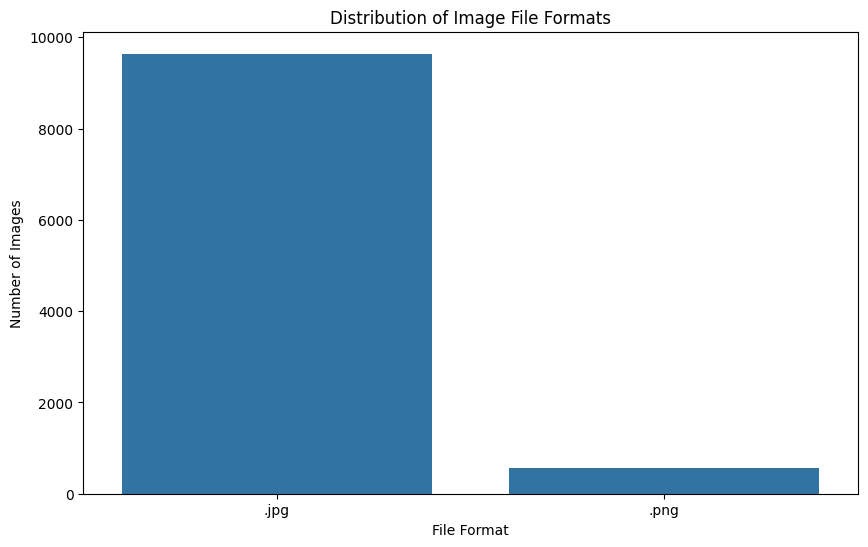

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Assuming 'sampled_df' is already loaded and contains 'filepaths'

# Extract file extensions
sampled_df['file_format'] = sampled_df['filepaths'].apply(lambda x: os.path.splitext(x)[1].lower())

# Count the occurrences of each file format
file_format_counts = sampled_df['file_format'].value_counts()

print("File format distribution:")
display(file_format_counts)

# Visualize the distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=file_format_counts.index, y=file_format_counts.values)
plt.title('Distribution of Image File Formats')
plt.xlabel('File Format')
plt.ylabel('Number of Images')
plt.show()

In [ ]:
!pip install imagehash Pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 18.3 MB/s eta 0:00:00


In [ ]:
import imagehash
from PIL import Image
import os
import pandas as pd
from collections import defaultdict

# Assuming 'sampled_df' is already loaded and contains 'filepaths'

image_hashes = {}
duplicates = defaultdict(list)

print(f"Identifying potential duplicate images on a sampled dataset ({len(sampled_df)} images). This may take some time...")

# Define batch size for processing (can be adjusted)
batch_size = 500 # Adjust batch size as needed

# Process images in batches
for i in range(0, len(sampled_df), batch_size):
    batch_df = sampled_df.iloc[i:i + batch_size]
    print(f"Processing batch {i // batch_size + 1}/{(len(sampled_df) + batch_size - 1) // batch_size}")

    for index, row in batch_df.iterrows():
        filepath = row['filepaths']
        try:
            # Open the image using Pillow
            img = Image.open(filepath).convert('RGB')

            # Calculate the average hash of the image
            img_hash = imagehash.average_hash(img)

            # Check if the hash is already in our dictionary
            if img_hash in image_hashes:
                duplicates[img_hash].append(filepath)
            else:
                image_hashes[img_hash] = filepath

        except Exception as e:
            print(f"Could not process image {filepath}: {e}")

print("Finished processing images for duplicate identification.")

# Report potential duplicates
print("\nPotential Duplicate Images (grouped by hash):")
count_duplicates = 0
for img_hash, filepaths in duplicates.items():
    if len(filepaths) > 1:
        count_duplicates += 1
        print(f"Hash: {img_hash}")
        for fp in filepaths:
            print(f"- {fp}")
        print("-" * 20)

if count_duplicates == 0:
    print("No potential duplicate images found in the sampled dataset.")

Identifying potential duplicate images on a sampled dataset (10195 images). This may take some time...
Processing batch 1/21
Processing batch 2/21
Processing batch 3/21
Processing batch 4/21
Processing batch 5/21
Processing batch 6/21
Processing batch 7/21
Processing batch 8/21
Processing batch 9/21
Processing batch 10/21
Processing batch 11/21
Processing batch 12/21
Processing batch 13/21
Processing batch 14/21
Processing batch 15/21
Processing batch 16/21
Processing batch 17/21
Processing batch 18/21
Processing batch 19/21
Processing batch 20/21
Processing batch 21/21
Finished processing images for duplicate identification.

Potential Duplicate Images (grouped by hash):
Hash: f3e3c1818181c3ff
- /content/drive/MyDrive/Reco-Plantes/Preparation manuelle du jeu de données V1/Dataset of Healthy Plants/Pepper,_bell___healthy/b4cb4cb0-ca61-4003-aa27-9918417fae68___JR_HL 8826.JPG
- /content/drive/MyDrive/Reco-Plantes/Preparation manuelle du jeu de données V1/Dataset of Healthy Plants/Soybean